## Neural Network + Mean Shift Approach

#### Imports

In [1]:
import cv2
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.utils import resample

#custom imports
from baseline import display_results
from dataprocessor import preprocess_data, calculate_metrics, resample_df, split_data
from datamaker import make_cluster_separated_metadata, update_thresholds, create_analysis_data
from constants import \
    DATASET_FOLDER, \
    BASELINE_AUGMENTED_METRIC_CSV_FILE, \
    BASELINE_METRIC_CSV_FILE, \
    BASELINE_TOPTHIRD_METRIC_CSV_FILE, \
    CLUSTER_SEPARATED_METADATA_CSV_FILE, \
    BASELINE_TOPTHIRD_RR8_METRIC_CSV_FILE, \
    BASELINE_TOPTHIRD_AUGMENTED_METRIC_CSV_FILE, \
    COLUMNS, \
    THRESHOLD

### Data Analysis of the Clusters

Pre-processing and Plotting the distribution of all clusters based on the perecnetage of pixels that are sky in a cluster, with Y-axis being the count of clusters

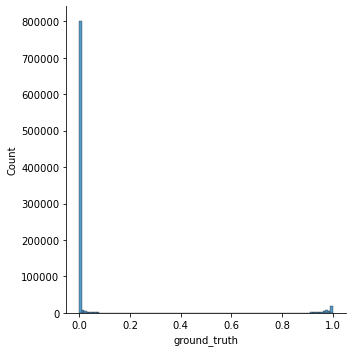

In [3]:
df_output = preprocess_data(CLUSTER_SEPARATED_METADATA_CSV_FILE, COLUMNS, plot=True)

#### Calculating the overall maximum performance we can gain from the data

In the following section, we use the pre-processed data fro the cluster analysis (where we have the percentage of sky of each cluster), and we take the precision and recall for each cluster and the number of pixels in each cluster as well. We get two sets of values, which are our theoretical limits to how well we can build a decision algorithm on top of this data.

Metric values per pixel, added together

In [4]:
df_pixel_cases = calculate_metrics(df_output, THRESHOLD, print_metrics=True, pixel_level_calculation=True)

True positive: 1203447617 (pixels)
False positive: 46582137 (pixels)
True negative: 1212402993 (pixels)
False negative: 33219665 (pixels)
Precision: 0.9627351774220247
Recall: 0.9731377505627258
F1: 0.9679085144492044


For all clusters that are classified as sky, show the distribution of ground_truth value

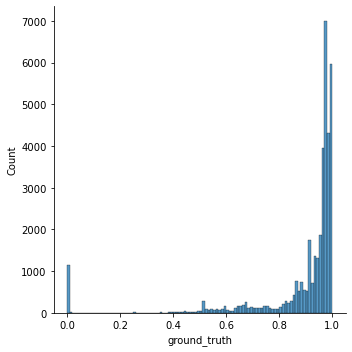

In [5]:
#for all rows in df where predicted_value = 1, plot the ground_truth value against the number of pixels/65536
df_plot = df_output[df_output['predicted_value'] == 1]
sns.displot(df_plot['ground_truth'], bins=100)#, y=df_plot['num_pixels']/65536)

For all clusters that are classified as ground, show the distribution of ground_truth value

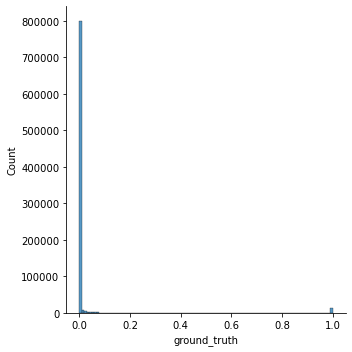

In [6]:
#for all rows in df where predicted_value = 0, plot the ground_truth value against the number of pixels/65536
df_plot = df_output[df_output['predicted_value'] == 0]
sns.displot(df_plot['ground_truth'], bins=100)#, y=df_temp['num_pixels']/65536)

Plotting the Clusters based on RGB values with a ground_truth value more than the threshold, where the redder the point, the higher the ground_truth

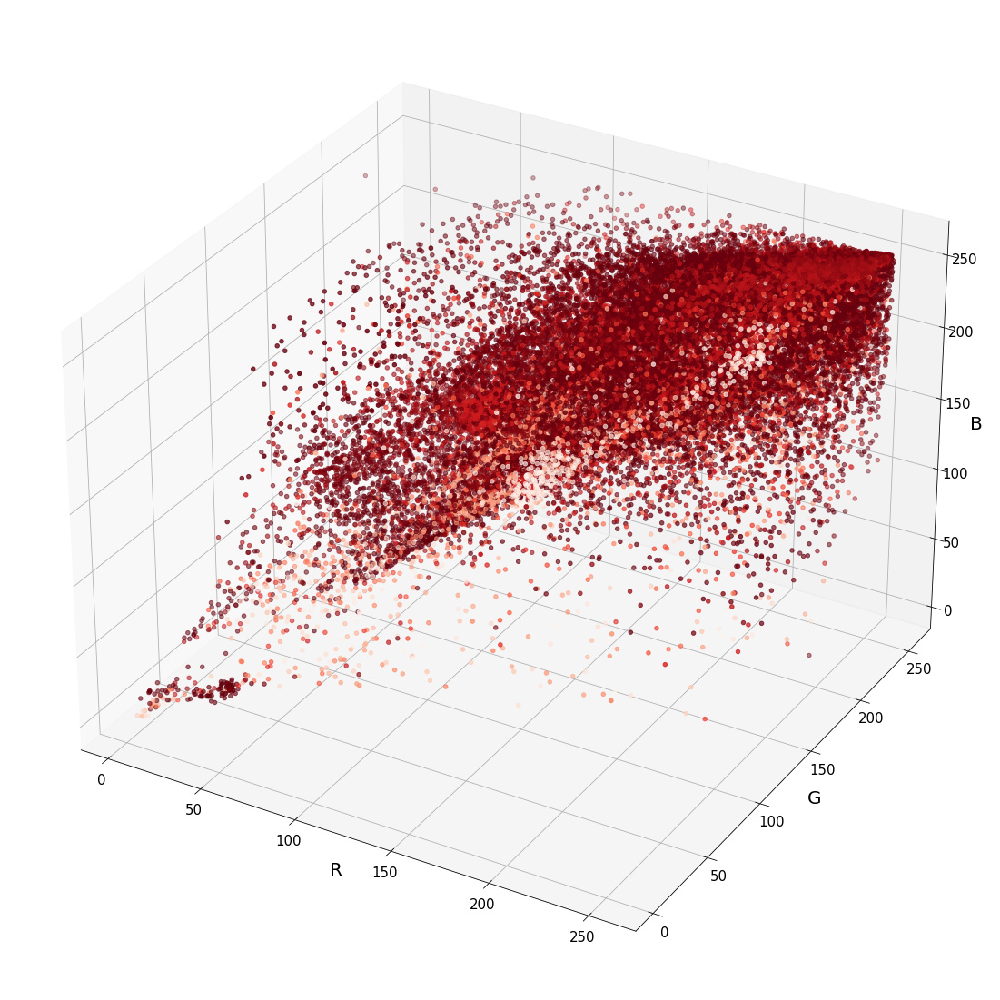

In [7]:
#for all rows in df_output, create a 3D plot of the R G and B value with higher values of ground_truth being redder
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(projection='3d')
df_filtered = df_output[df_output['ground_truth'] > THRESHOLD]
ax.scatter(df_filtered['R'], df_filtered['G'], df_filtered['B'], c=df_filtered['ground_truth'], cmap='Reds')     
ax.set_xlabel('R', fontsize=20)
ax.set_ylabel('G', fontsize=20)
ax.set_zlabel('B', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.show()

Plotting the Clusters based on cX and cY values with a ground_truth value less than the threshold, where the redder the point, the higher the ground_truth value

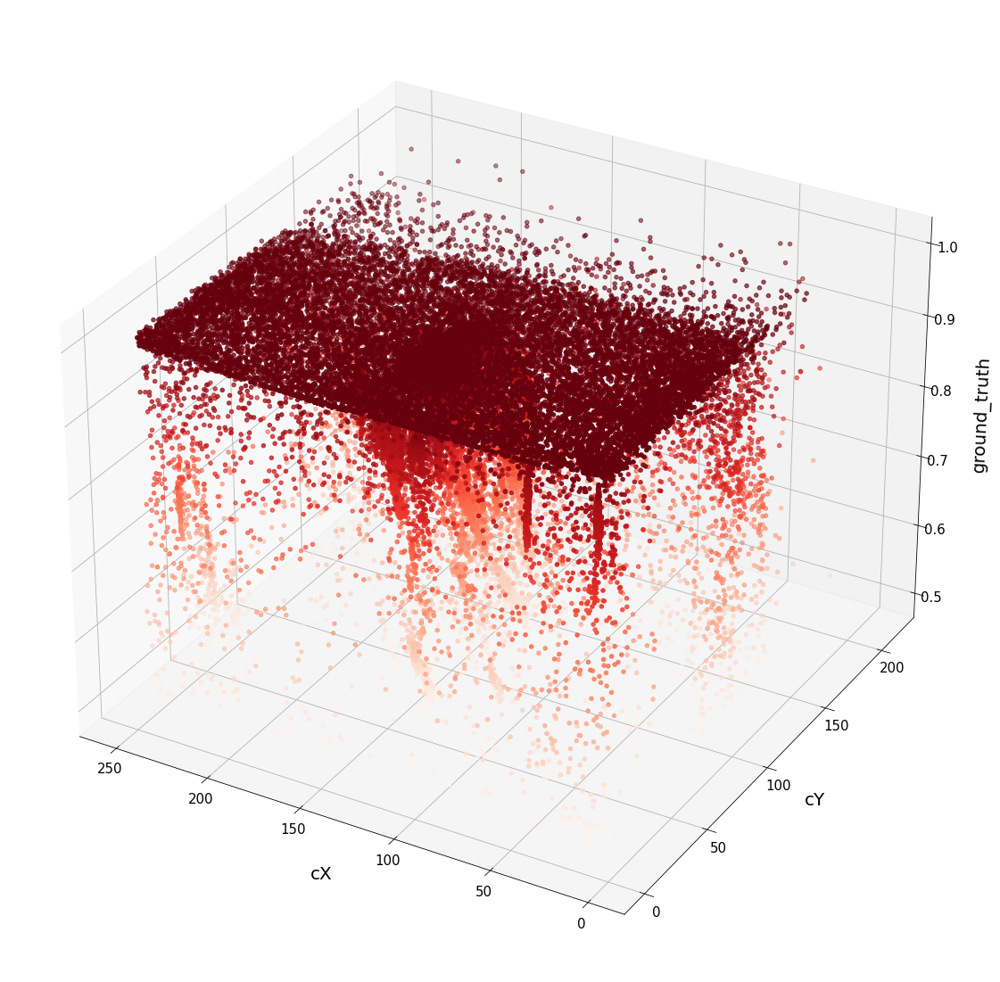

In [7]:
#for all rows in df_output, create a 2D plot of cX and cY with higher values of ground_truth being redder
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(projection='3d')
df_filtered = df_output[df_output['ground_truth'] > THRESHOLD]
ax.scatter(df_filtered['cX'], df_filtered['cY'], df_filtered['ground_truth'], c=df_filtered['ground_truth'], cmap='Reds')   
ax.set_xlabel('cX', fontsize=20, labelpad=20)
ax.set_ylabel('cY', fontsize=20, labelpad=20)
ax.set_zlabel('ground_truth', fontsize=20, labelpad=20)
ax.tick_params(axis='both', which='major', labelsize=15)
ax.invert_xaxis()
#ax.invert_yaxis()
plt.show()

#### Setting the threshold values for the columns R, G, B, cX and cY with a lower and upper quantile, and threshold value

The following function takes quantile values that say that we cover 96% of all cases where the cY is in the upper half, and the threshold is greater than the defined threshold value. The reason we take quantiles, and not all the values is that we want to reduce false positive cases as much as possible. We then save the upper and lower limits of the values in a JSON file, which is used later for Baseline augmentation.

In [8]:
lower_q = 0.02
upper_q = 0.98

# Set the path to the threshold.json file
threshold_file = 'threshold.json'

#update_thresholds(df_output, THRESHOLD, lower_q, upper_q, threshold_file)

# Analysis of Variations of Baseline-Mean-Shift

#### Baseline-Mean-Shift Analysis of the Clusters

The mean values of precision and recall are: 
 precision    0.959041
recall       0.894661
dtype: float64
The median values of precision and recall are: 
 precision    0.983473
recall       0.982475
dtype: float64
The standard deviation of precision and recall are: 
 precision    0.095867
recall       0.197212
dtype: float64


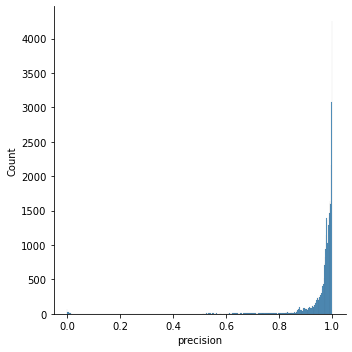

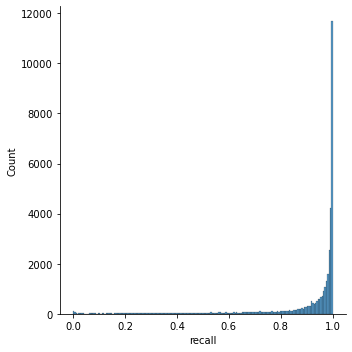

In [9]:
from baseline import baseline_mean_shift

#run this statement to make the data
#create_analysis_data(ORIGINAL_IMAGES_CSV, BASELINE_METRIC_CSV_FILE, function = 'baseline')

#show the average precision and recall from the file BASELINE_AUGMENTED_METRIC_CSV_FILE
df_baseline = pd.read_csv(BASELINE_METRIC_CSV_FILE)
df_baseline = df_baseline.dropna(subset=['precision'])

#show the average precision and recall from df_baseline_augmented
print("The mean values of precision and recall are: \n", df_baseline[['precision', 'recall']].mean())
print("The median values of precision and recall are: \n", df_baseline[['precision', 'recall']].median())
print("The standard deviation of precision and recall are: \n", df_baseline[['precision', 'recall']].std())

#show a plot of the distribution of precision and recall values from df_baseline_augmented
sns.displot(df_baseline['precision'])
sns.displot(df_baseline['recall'])

#### Failure Cases for Baseline-Mean-Shift

OriginalImages\9291\20140831_104525.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.0770573616027832


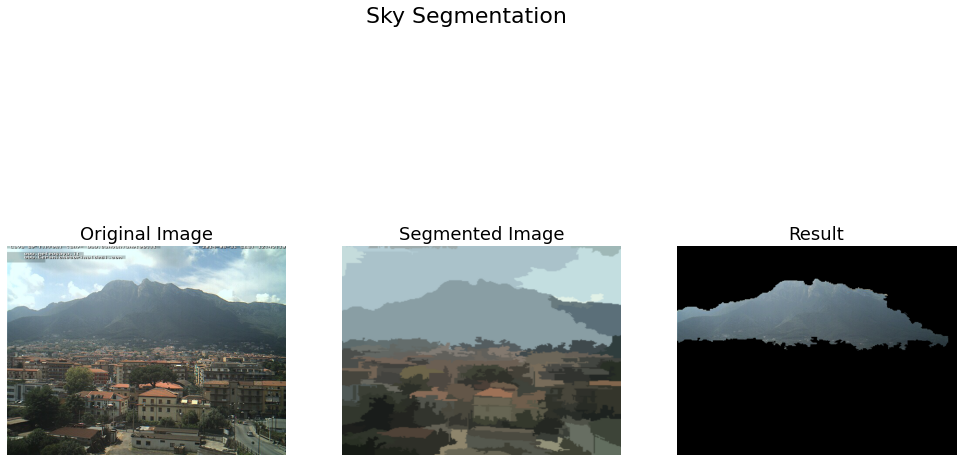

Precision: 0.007444045590643661
Recall: 0.006895600606812853
F1: 0.0071593349773287724
------------------------------------------------------------------------------------------------------------------------
OriginalImages\4795\20121102_130415.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 4795, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.07327699661254883


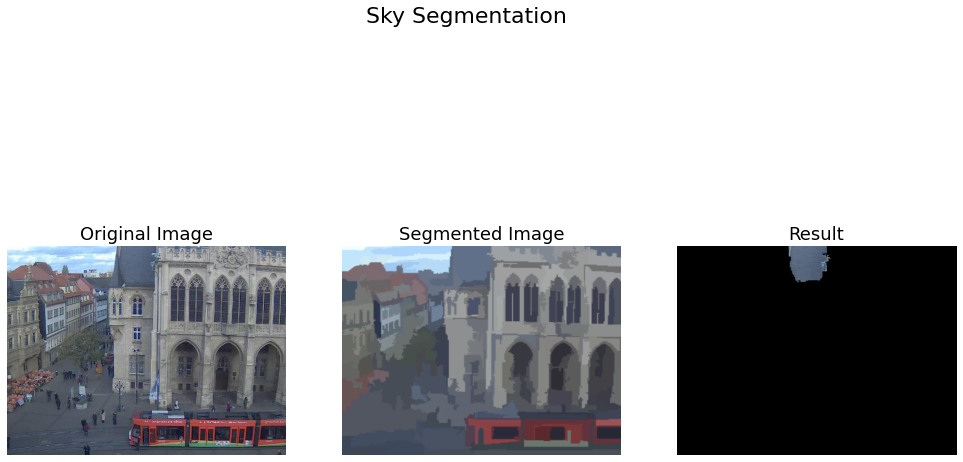

c:\Users\cjbla\OneDrive\Desktop\Code\masterthesis\baseline.py:385: RuntimeWarning: invalid value encountered in double_scalars
  f1 = 2 * (precision * recall) / (precision + recall)


Precision: 0.0
Recall: 0.0
F1: nan
------------------------------------------------------------------------------------------------------------------------
OriginalImages\5021\20130603_084700.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 5021, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.07600879669189453


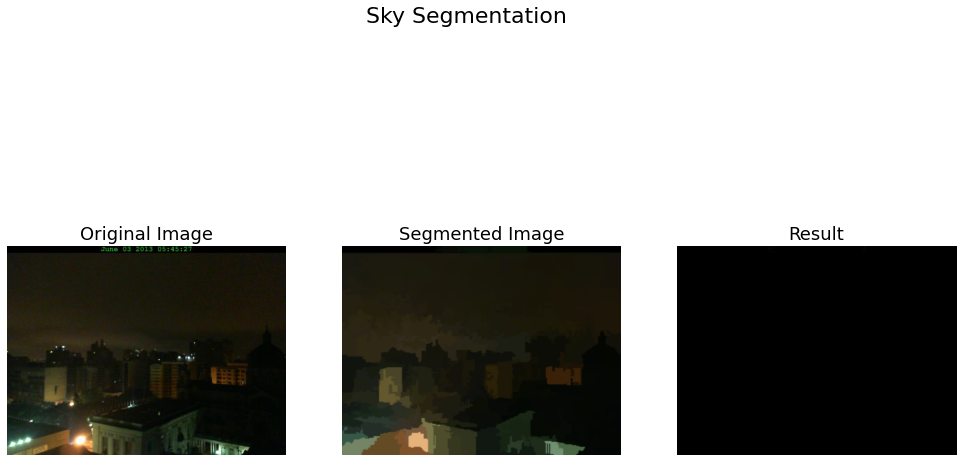

Precision: 0.0
Recall: 0.0
F1: nan
------------------------------------------------------------------------------------------------------------------------
OriginalImages\9291\20140913_171527.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.0634760856628418


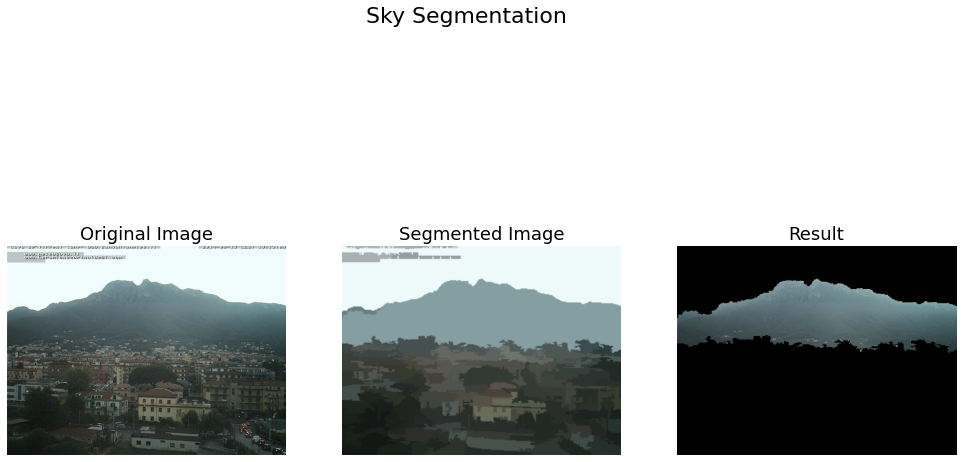

Precision: 0.003842887779041149
Recall: 0.004091389693375626
F1: 0.0039632471908444536
------------------------------------------------------------------------------------------------------------------------
OriginalImages\9708\20110317_190519.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9708, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.09053659439086914


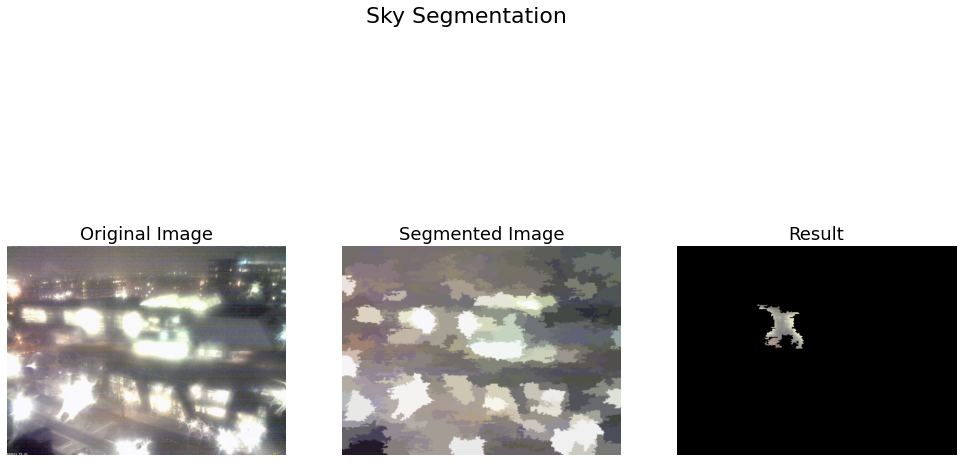

Precision: 0.0
Recall: 0.0
F1: nan
------------------------------------------------------------------------------------------------------------------------


In [10]:
#show 5 images where precision is below 0.2
df_temp = df_baseline[df_baseline['precision'] < 0.2]

#perform plt.imread of the 'image_path' column'
for path, precision in df_temp.sample(n=5)[['image_path', 'precision']].values:
    img = plt.imread(str(DATASET_FOLDER + "original\\" + path))
    img = cv2.resize(img, (256, 256))
    print(path)
    _ = display_results(DATASET_FOLDER + "original\\" + path, baseline_mean_shift, print_mode = 'display',dataset_mode='validate', spatial_radius=2, range_radius=2, min_density=150) 

#### Baseline-Mean-Shift-Augmented Analysis of the Clusters

The mean values of precision and recall are: 
 precision    0.913366
recall       0.946245
dtype: float64
The median values of precision and recall are: 
 precision    0.969174
recall       0.994329
dtype: float64
The standard deviation of precision and recall are: 
 precision    0.14349
recall       0.15021
dtype: float64


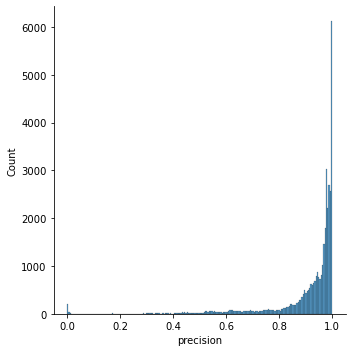

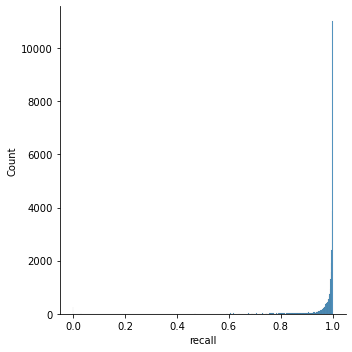

In [11]:
from baseline import baseline_augmented  #"R": [69.72868870665498, 250.6745962903452], "G": [93.74272721540538, 251.39504492798588], "B": [105.80529925621141, 252.79725294497683]

#run this statement to make the data
#create_analysis_data(ORIGINAL_IMAGES_CSV, BASELINE_AUGMENTED_METRIC_CSV_FILE, function='baseline_augmented')

#show the average precision and recall from the file BASELINE_AUGMENTED_METRIC_CSV_FILE
df_baseline_augmented = pd.read_csv(BASELINE_AUGMENTED_METRIC_CSV_FILE)

#replace all nan values with 0 in the precision column
df_baseline_augmented['precision'] = df_baseline_augmented['precision'].fillna(0)

#show the average precision and recall from df_baseline_augmented
print("The mean values of precision and recall are: \n", df_baseline_augmented[['precision', 'recall']].mean())
print("The median values of precision and recall are: \n", df_baseline_augmented[['precision', 'recall']].median())
print("The standard deviation of precision and recall are: \n", df_baseline_augmented[['precision', 'recall']].std())

#show a plot of the distribution of precision and recall values from df_baseline_augmented
sns.displot(df_baseline_augmented['precision'])
sns.displot(df_baseline_augmented['recall'])

#### Failure Cases for Basleine-Mean-Shift-Augmented

OriginalImages\19306\20130611_145331.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.11504745483398438


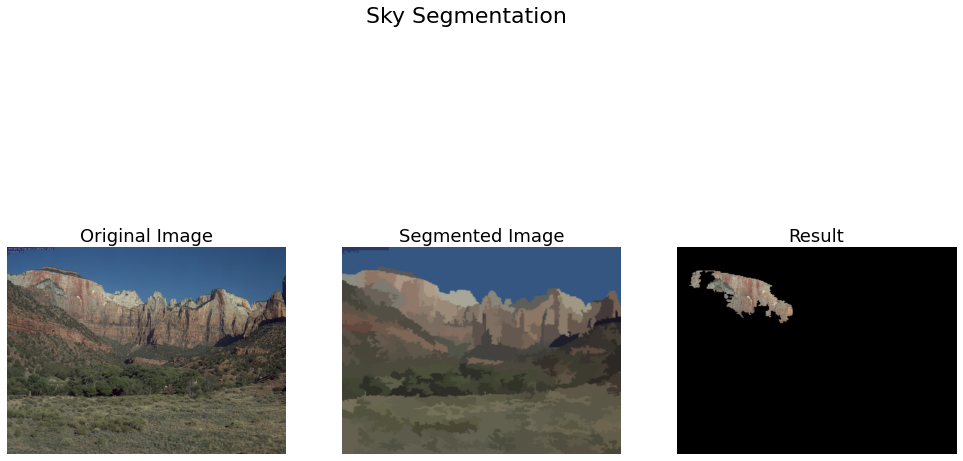

Precision: 2.1077480819492455e-05
Recall: 4.1917472879395045e-06
F1: 6.992811389891191e-06
------------------------------------------------------------------------------------------------------------------------
OriginalImages\19306\20130605_172339.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.113525390625


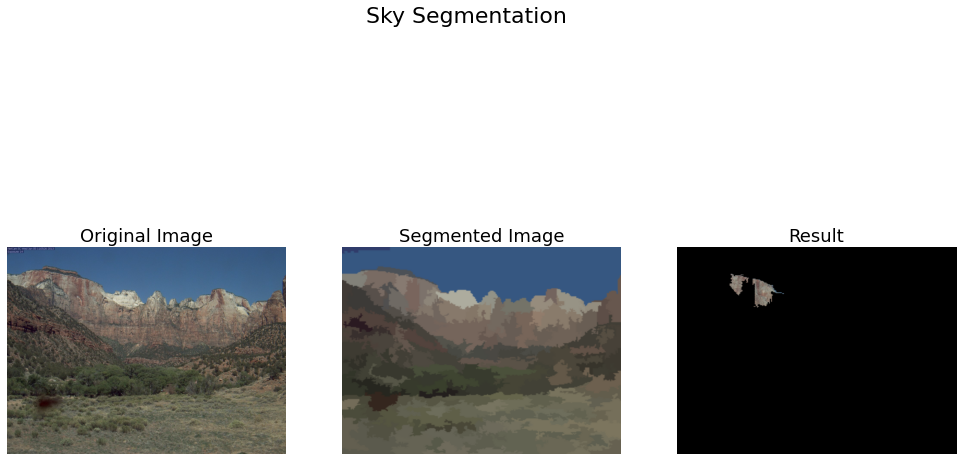

Precision: 0.010527844333115516
Recall: 0.0006078033567512281
F1: 0.0011492567479204397
------------------------------------------------------------------------------------------------------------------------
OriginalImages\19306\20130817_152326.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.299213171005249


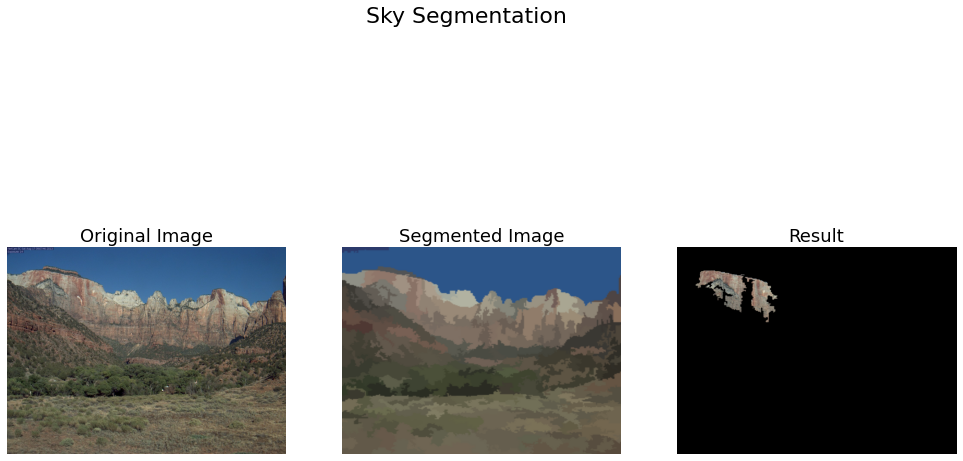

Precision: 0.000635481999281629
Recall: 9.64101876226086e-05
F1: 0.00016742066626146014
------------------------------------------------------------------------------------------------------------------------
OriginalImages\10066\20131118_155723.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 10066, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.08852291107177734


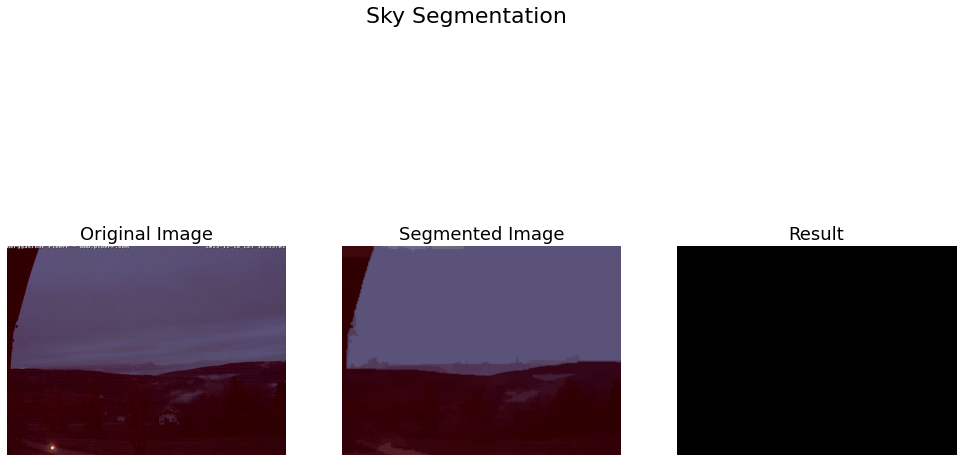

c:\Users\cjbla\OneDrive\Desktop\Code\masterthesis\baseline.py:383: RuntimeWarning: invalid value encountered in long_scalars
  precision = true_pos / (true_pos + false_pos)


Precision: nan
Recall: 0.0
F1: nan
------------------------------------------------------------------------------------------------------------------------
OriginalImages\19306\20130301_165326.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.11455535888671875


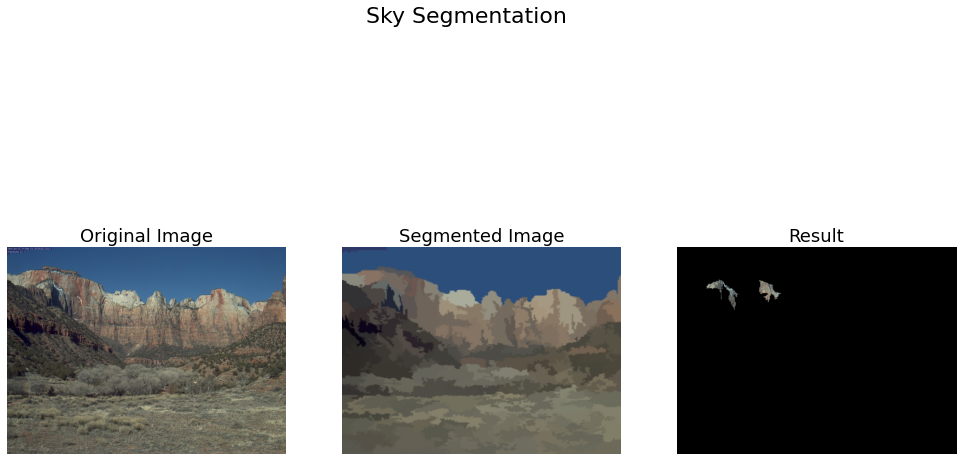

Precision: 0.004864417304905817
Recall: 0.00019701212253315673
F1: 0.0003786871641165712
------------------------------------------------------------------------------------------------------------------------


In [12]:
#show 5 images where precision is below 0.2
df_temp = df_baseline_augmented[df_baseline_augmented['precision'] < 0.2]

#perform plt.imread of the 'image_path' column'
for path, precision in df_temp.sample(n=5)[['image_path', 'precision']].values:
    img = plt.imread(str(DATASET_FOLDER + "original\\" + path))
    img = cv2.resize(img, (256, 256))
    print(path)
    _ = display_results(DATASET_FOLDER + "original\\" + path, baseline_augmented, print_mode='display', dataset_mode='validate', spatial_radius=2, range_radius=2, min_density=150)

#### Analysis of Baseline-Mean-Shift-Top-Third

The mean values of precision and recall are: 
 precision    0.963714
recall       0.896696
dtype: float64
The median values of precision and recall are: 
 precision    0.983714
recall       0.982556
dtype: float64
The standard deviation of precision and recall are: 
 precision    0.070105
recall       0.193286
dtype: float64


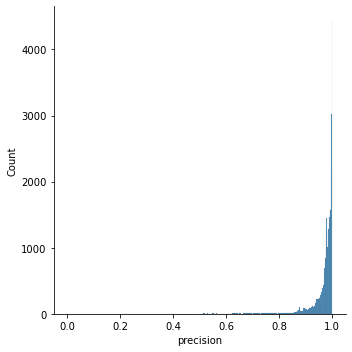

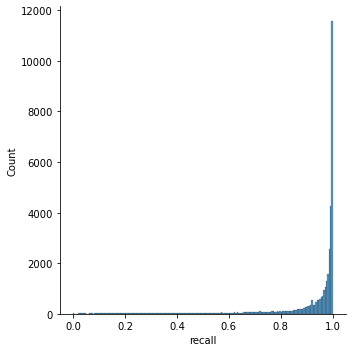

In [13]:
from baseline import baseline_mean_shift_third

#run this statement to make the data
#create_analysis_data(ORIGINAL_IMAGES_CSV, BASELINE_TOPTHIRD_METRIC_CSV_FILE, function='baseline_topthird')

#show the average precision and recall from the file BASELINE_AUGMENTED_METRIC_CSV_FILE
df_baseline_topthird = pd.read_csv(BASELINE_TOPTHIRD_METRIC_CSV_FILE)

#replace all nan values with 0 in the precision column
df_baseline_topthird['precision'] = df_baseline_topthird['precision'].fillna(0)

#show the average precision and recall from df_baseline_augmented
print("The mean values of precision and recall are: \n", df_baseline_topthird[['precision', 'recall']].mean())
print("The median values of precision and recall are: \n", df_baseline_topthird[['precision', 'recall']].median())
print("The standard deviation of precision and recall are: \n", df_baseline_topthird[['precision', 'recall']].std())

#show a plot of the distribution of precision and recall values from df_baseline_augmented
sns.displot(df_baseline_topthird['precision'])
sns.displot(df_baseline_topthird['recall'])

#### Example for high performance

0.9968380675927846
OriginalImages\623\20140809_204157.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 623, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.08351683616638184


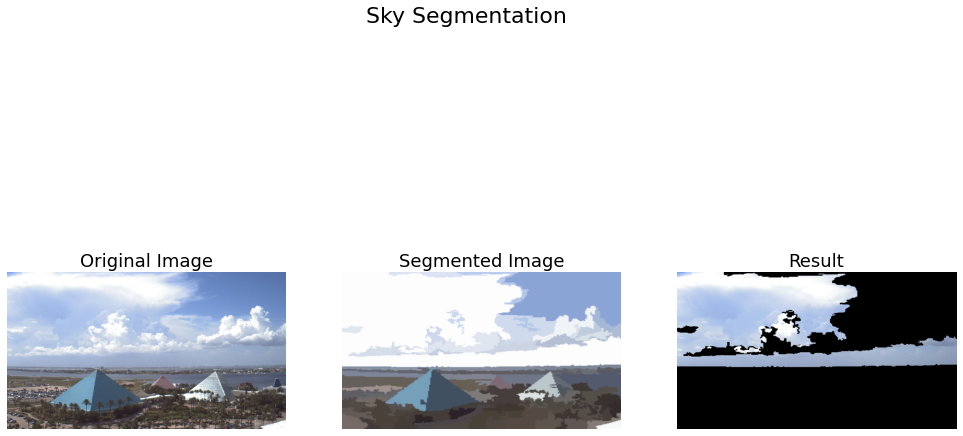

Precision: 0.9968380675927846
Recall: 0.5906817664425068
F1: 0.7418037343522743
------------------------------------------------------------------------------------------------------------------------


In [14]:
#show 5 images where precision is below 0.2
df_temp = df_baseline_topthird[df_baseline_topthird['precision'] > 0.99]

#perform plt.imread of the 'image_path' column'
for path, precision in df_temp.sample(n=1)[['image_path', 'precision']].values:
    print(precision)
    img = plt.imread(str(DATASET_FOLDER + "original\\" + path))
    img = cv2.resize(img, (256, 256))
    print(path)
    _ = display_results(DATASET_FOLDER + "original\\" + path, baseline_mean_shift_third, print_mode='display', dataset_mode='validate', spatial_radius=2, range_radius=2, min_density=150)

#### Failure Cases for Baseline Top Third

38082
26
0.0
OriginalImages\5020\20140916_214537.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 5020, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.09651803970336914


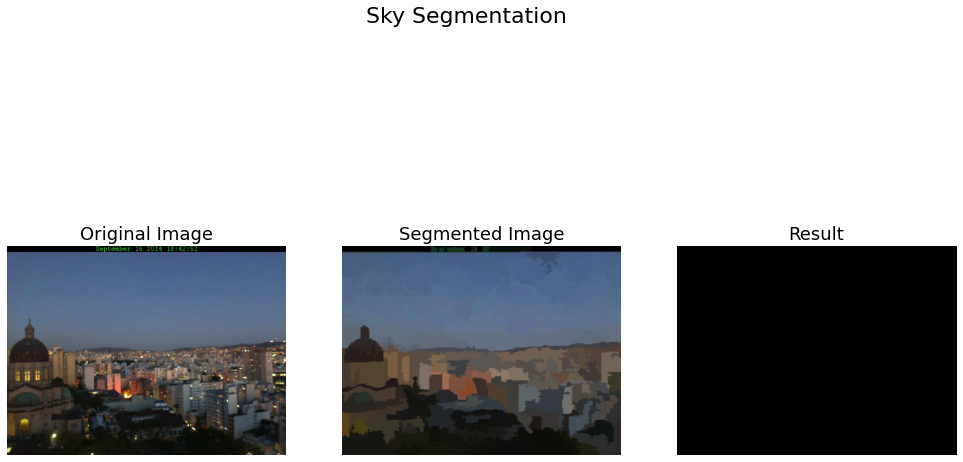

c:\Users\cjbla\OneDrive\Desktop\Code\masterthesis\baseline.py:385: RuntimeWarning: invalid value encountered in double_scalars
  f1 = 2 * (precision * recall) / (precision + recall)


Precision: 0.0
Recall: 0.0
F1: nan
------------------------------------------------------------------------------------------------------------------------
0.0022160210111621
OriginalImages\9708\20110327_043519.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9708, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.16003918647766113


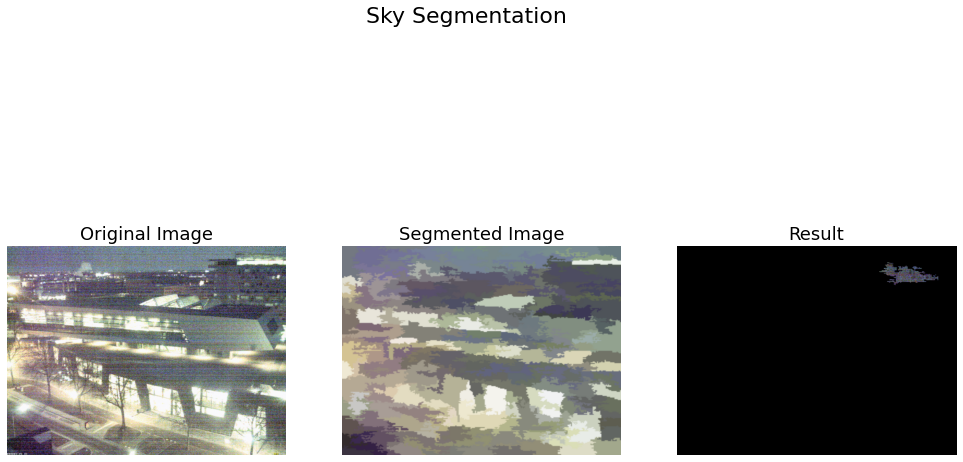

Precision: 0.00221602101116218
Recall: 0.0002077130790002077
F1: 0.0003798242960941401
------------------------------------------------------------------------------------------------------------------------
0.0
OriginalImages\9708\20110528_023519.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9708, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.09249734878540039


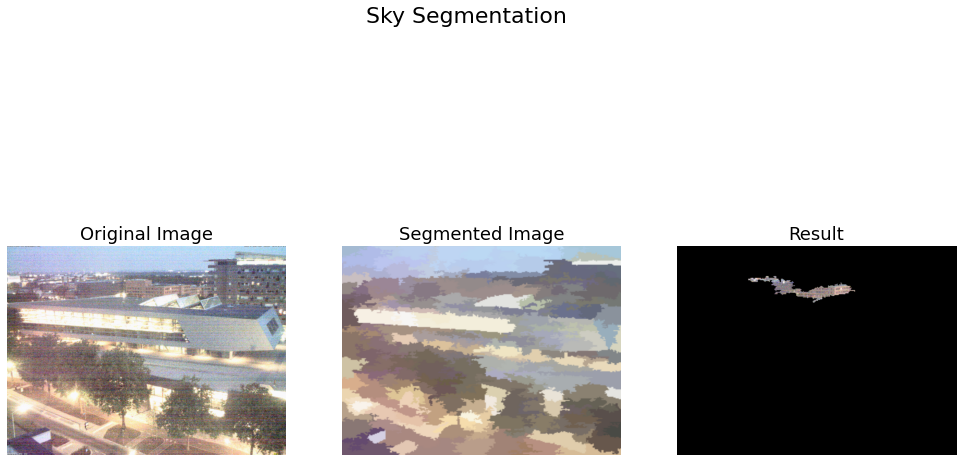

Precision: 0.0
Recall: 0.0
F1: nan
------------------------------------------------------------------------------------------------------------------------
0.0031991917831284
OriginalImages\19306\20130402_022333.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.1085200309753418


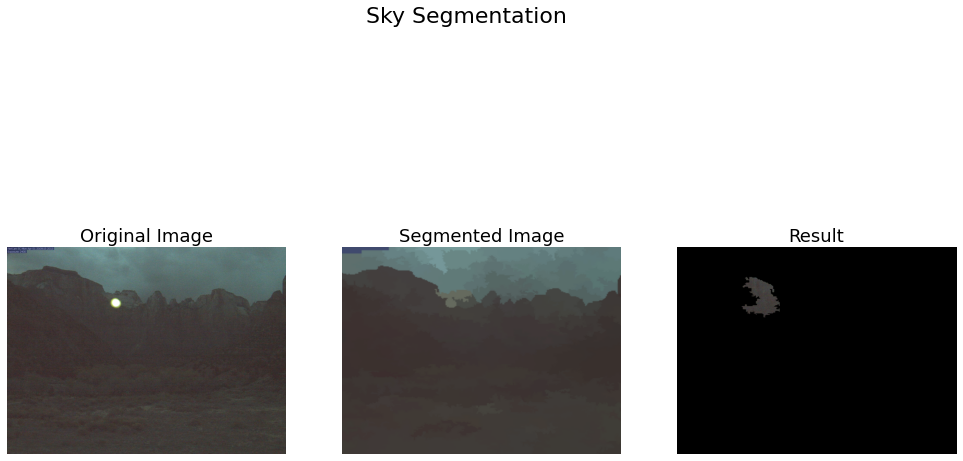

Precision: 0.0031991917831284728
Recall: 0.00023892959541255176
F1: 0.00044465073464882343
------------------------------------------------------------------------------------------------------------------------
0.0004646074067413
OriginalImages\19306\20131129_205330.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 2, range_radius: 2, min_density: 150
Time taken:  0.0960392951965332


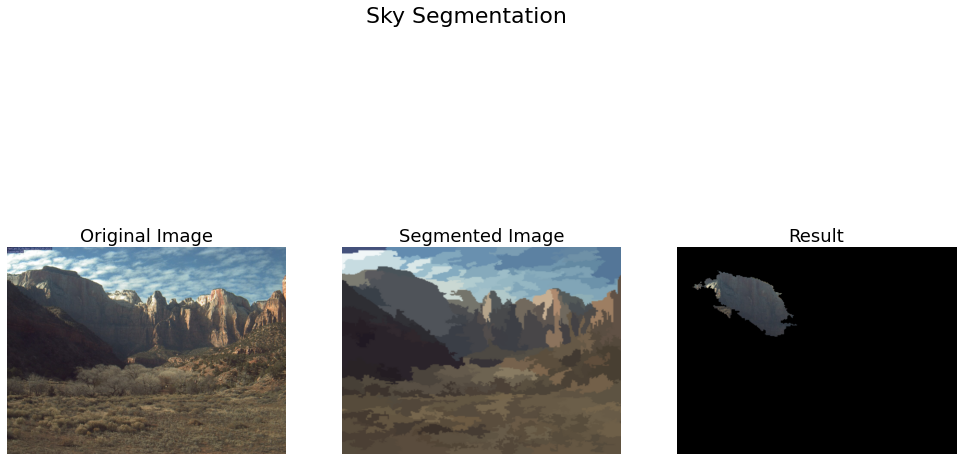

Precision: 0.0004646074067413036
Recall: 0.00012994416592612465
F1: 0.0002030875864350595
------------------------------------------------------------------------------------------------------------------------


In [15]:
#show 5 images where precision is below 0.2
df_temp = df_baseline_topthird[(df_baseline_topthird['recall'] < 0.2) & (df_baseline_topthird['precision'] < 0.2)]

print(len(df_baseline_topthird))
print(len(df_temp))

#perform plt.imread of the 'image_path' column'
for path, precision in df_temp.sample(n=5)[['image_path', 'precision']].values:
    print(precision)
    img = plt.imread(str(DATASET_FOLDER + "original\\" + path))
    img = cv2.resize(img, (256, 256))
    print(path)
    _ = display_results(DATASET_FOLDER + "original\\" + path, baseline_mean_shift_third, print_mode='display', dataset_mode='validate', spatial_radius=2, range_radius=2, min_density=150)

#### Comparitive Table


The mean values of precision and recall are: 
                                precision    recall
method                                            
baseline-mean-shift             0.959041  0.894661
baseline-mean-shift-augmented   0.913366  0.946245
baseline-mean-shift-top-third   0.963714  0.896696

The median values of precision and recall are: 
                                precision    recall
method                                            
baseline-mean-shift             0.983473  0.982475
baseline-mean-shift-augmented   0.969174  0.994329
baseline-mean-shift-top-third   0.983714  0.982556

The standard deviation of precision and recall are: 
                                precision    recall
method                                            
baseline-mean-shift             0.095867  0.197212
baseline-mean-shift-augmented   0.143490  0.150210
baseline-mean-shift-top-third   0.070105  0.193286


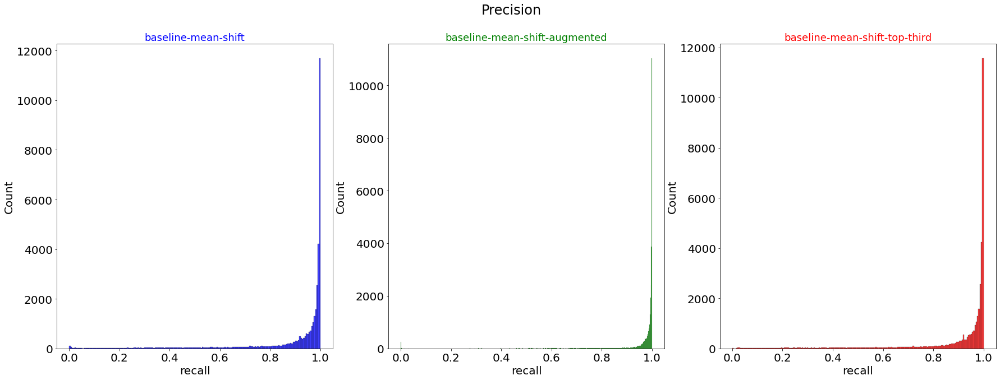

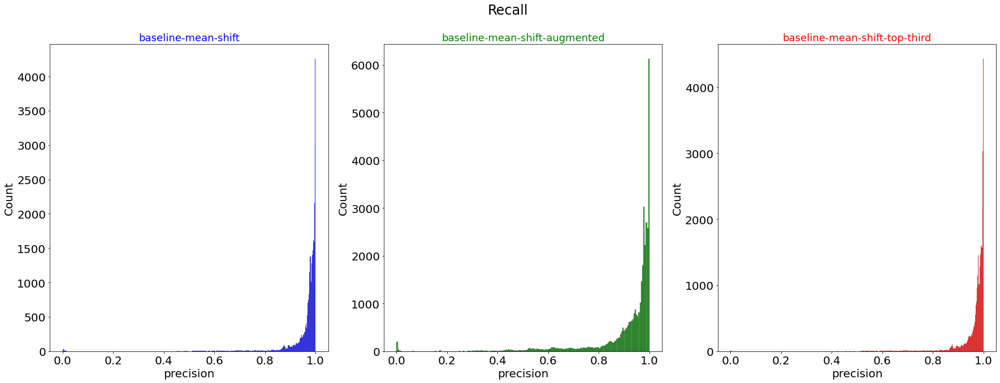

In [16]:
#take df_baseline, df_baseline_augmented, df_baseline_topthird and combine them into one dataframe, and show their mean, median and standard deviation based on the method
df_baseline['method'] = 'baseline-mean-shift'
df_baseline_augmented['method'] = 'baseline-mean-shift-augmented'
df_baseline_topthird['method'] = 'baseline-mean-shift-top-third'

df_combined = pd.concat([df_baseline, df_baseline_augmented, df_baseline_topthird])

plt.rcParams.update({'font.size': 20})

print("\nThe mean values of precision and recall are: \n", df_combined.groupby('method')[['precision', 'recall']].mean())
print("\nThe median values of precision and recall are: \n", df_combined.groupby('method')[['precision', 'recall']].median())
print("\nThe standard deviation of precision and recall are: \n", df_combined.groupby('method')[['precision', 'recall']].std())

# Plot the distribution of precision and recall for each method
fig1, axs1 = plt.subplots(1, 3, figsize=(30, 10))
fig2, axs2 = plt.subplots(1, 3, figsize=(30, 10))
colors = ['blue', 'green', 'red']

for i, method in enumerate(df_combined['method'].unique()):
    sns.histplot(data=df_combined[df_combined['method'] == method], x='recall', ax=axs1[i], color=colors[i])
    axs1[i].set_title(f'{method}', color=colors[i], fontsize=18)

for i, method in enumerate(df_combined['method'].unique()):
    sns.histplot(data=df_combined[df_combined['method'] == method], x='precision', ax=axs2[i], color=colors[i])
    axs2[i].set_title(f'{method}', color=colors[i], fontsize=18)

fig1.suptitle('Precision', fontsize=24)
fig2.suptitle('Recall', fontsize=24)

plt.show()

#### Baseline with Color Range 8

The mean values of precision and recall are: 
 precision    0.920666
recall       0.968776
dtype: float64
The median values of precision and recall are: 
 precision    0.971873
recall       0.997349
dtype: float64
The standard deviation of precision and recall are: 
 precision    0.132949
recall       0.109068
dtype: float64


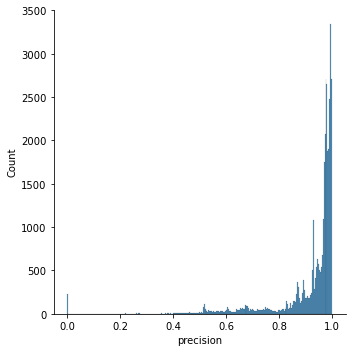

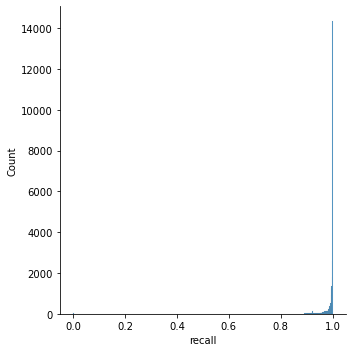

In [6]:
from baseline import baseline_mean_shift_third

#run this statement to make the data
#create_analysis_data(ORIGINAL_IMAGES_CSV, BASELINE_TOPTHIRD_RR8_METRIC_CSV_FILE, function='baseline_topthird_rr8')

#show the average precision and recall from the file BASELINE_AUGMENTED_METRIC_CSV_FILE
df_baseline_topthird_rr8 = pd.read_csv(BASELINE_TOPTHIRD_RR8_METRIC_CSV_FILE)

#replace all nan values with 0 in the precision column
df_baseline_topthird_rr8['precision'] = df_baseline_topthird_rr8['precision'].fillna(0)

#show the average precision and recall from df_baseline_augmented
print("The mean values of precision and recall are: \n", df_baseline_topthird_rr8[['precision', 'recall']].mean())
print("The median values of precision and recall are: \n", df_baseline_topthird_rr8[['precision', 'recall']].median())
print("The standard deviation of precision and recall are: \n", df_baseline_topthird_rr8[['precision', 'recall']].std())

#show a plot of the distribution of precision and recall values from df_baseline_augmented
sns.displot(df_baseline_topthird_rr8['precision'])
sns.displot(df_baseline_topthird_rr8['recall'])

#### Analysis of Baseline-Mean-Shift-Top-Third-Augmented

The mean values of precision and recall are: 
 precision    0.907575
recall       0.923538
dtype: float64
The median values of precision and recall are: 
 precision    0.964985
recall       0.988174
dtype: float64
The standard deviation of precision and recall are: 
 precision    0.130854
recall       0.152287
dtype: float64


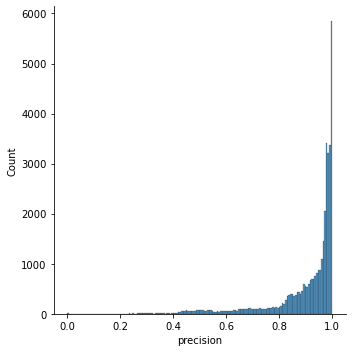

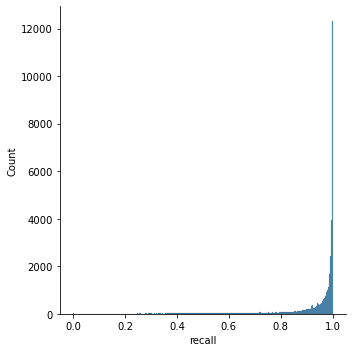

In [7]:
from baseline import baseline_mean_shift_third_augmented

#run this statement to make the data
#create_analysis_data(ORIGINAL_IMAGES_CSV, BASELINE_TOPTHIRD_AUGMENTED_METRIC_CSV_FILE, function='baseline_topthird_augmented')

#show the average precision and recall from the file BASELINE_AUGMENTED_METRIC_CSV_FILE
df_baseline_topthird_augmented = pd.read_csv(BASELINE_TOPTHIRD_AUGMENTED_METRIC_CSV_FILE)

#replace all nan values with 0 in the precision column
df_baseline_topthird_augmented['precision'] = df_baseline_topthird_augmented['precision'].fillna(0)

#show the average precision and recall from df_baseline_augmented
print("The mean values of precision and recall are: \n", df_baseline_topthird_augmented[['precision', 'recall']].mean())
print("The median values of precision and recall are: \n", df_baseline_topthird_augmented[['precision', 'recall']].median())
print("The standard deviation of precision and recall are: \n", df_baseline_topthird_augmented[['precision', 'recall']].std())

#show a plot of the distribution of precision and recall values from df_baseline_augmented
sns.displot(df_baseline_topthird_augmented['precision'])
sns.displot(df_baseline_topthird_augmented['recall'])

### Visual Inspection of Images

False Positive Cases: Cases where the cluster is predicted sky but is not sky

OriginalImages\9708\20110530_073519.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9708, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.08700323104858398


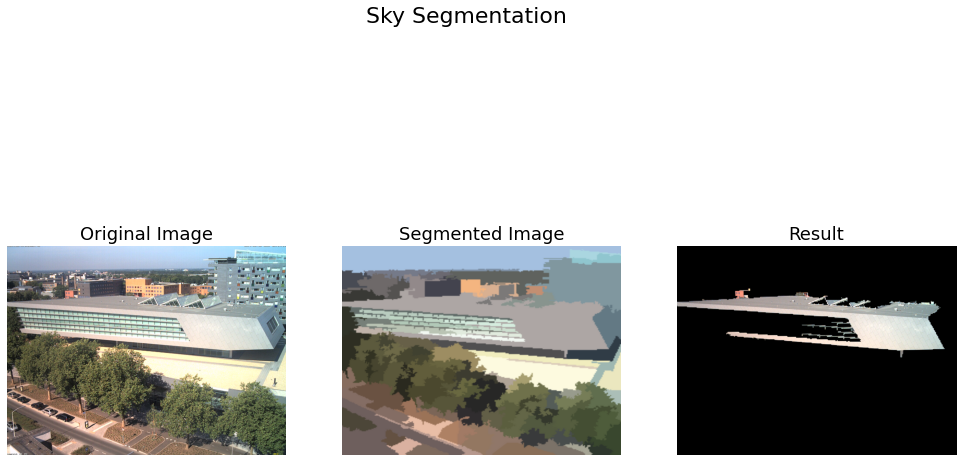

------------------------------------------------------------------------------------------------------------------------
OriginalImages\9291\20140429_144516.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.06700396537780762


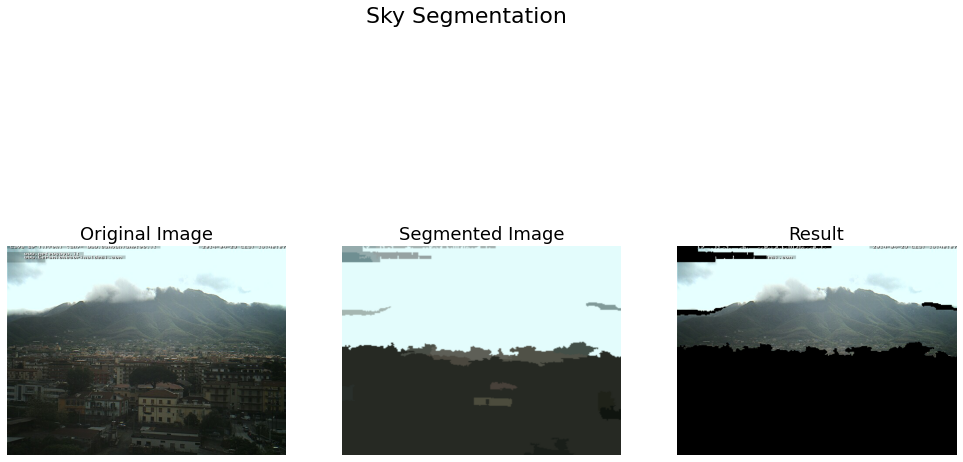

------------------------------------------------------------------------------------------------------------------------
OriginalImages\11331\20140612_171123.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 11331, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.04752159118652344


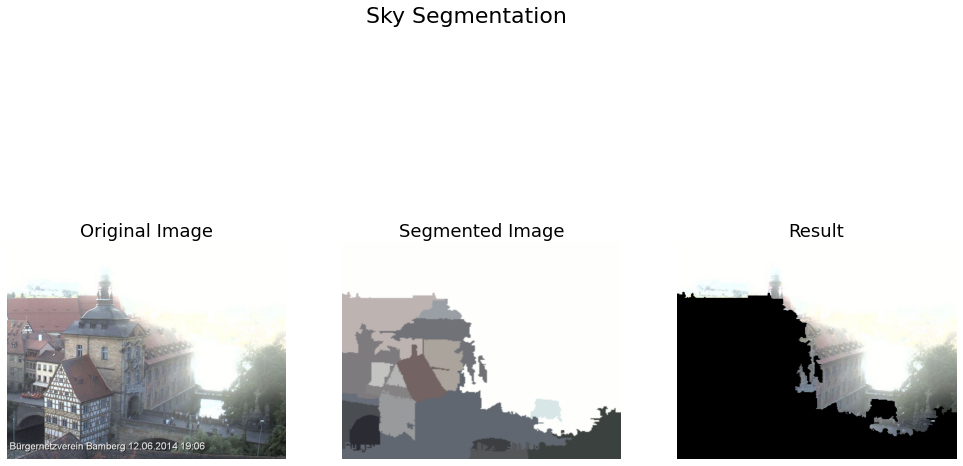

------------------------------------------------------------------------------------------------------------------------
OriginalImages\9291\20140629_134527.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.06250572204589844


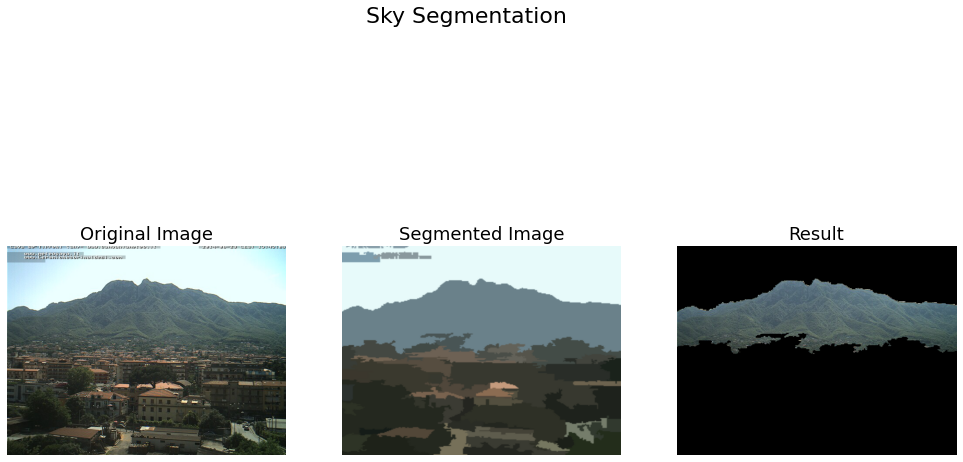

------------------------------------------------------------------------------------------------------------------------
OriginalImages\9708\20110322_120518.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9708, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.09451699256896973


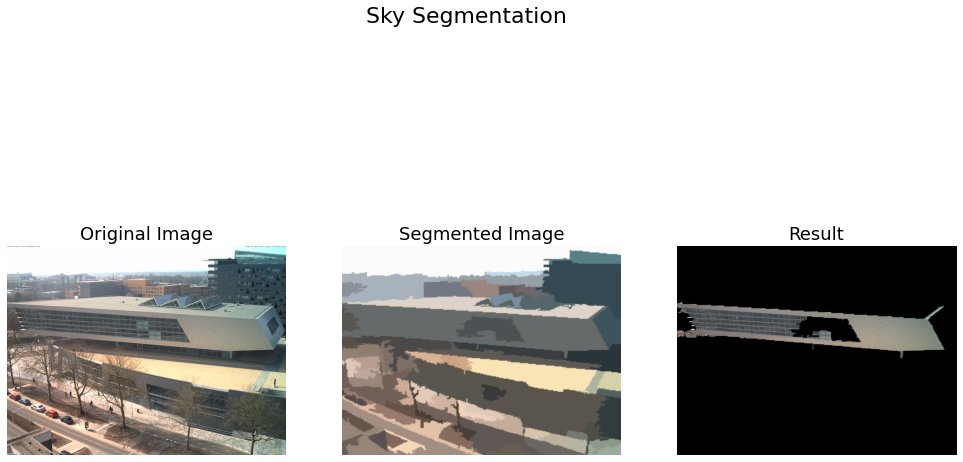

------------------------------------------------------------------------------------------------------------------------
OriginalImages\19306\20130830_182328.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.07999873161315918


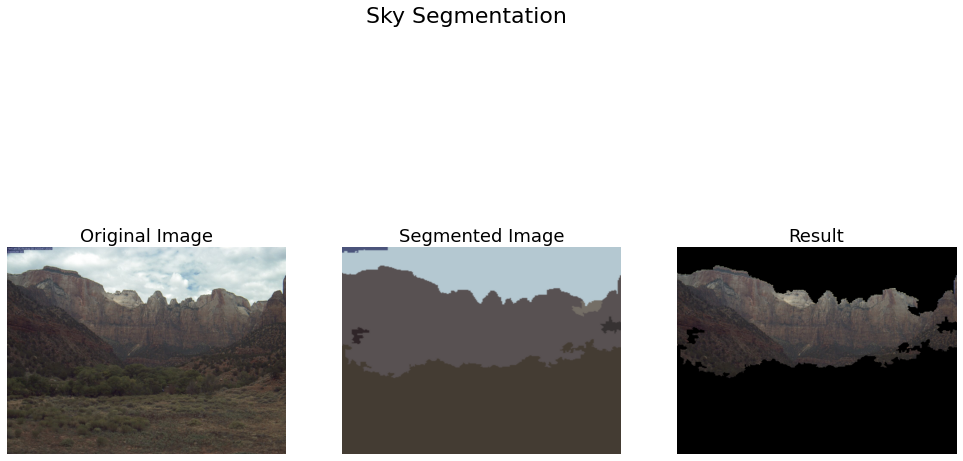

------------------------------------------------------------------------------------------------------------------------
OriginalImages\3888\20131210_074238.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 3888, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.04800081253051758


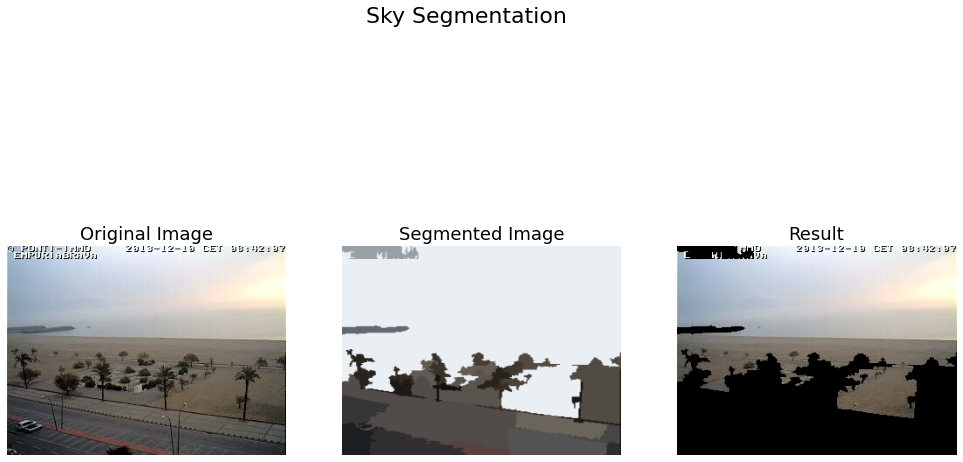

------------------------------------------------------------------------------------------------------------------------
OriginalImages\9708\20110323_140520.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9708, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.09151577949523926


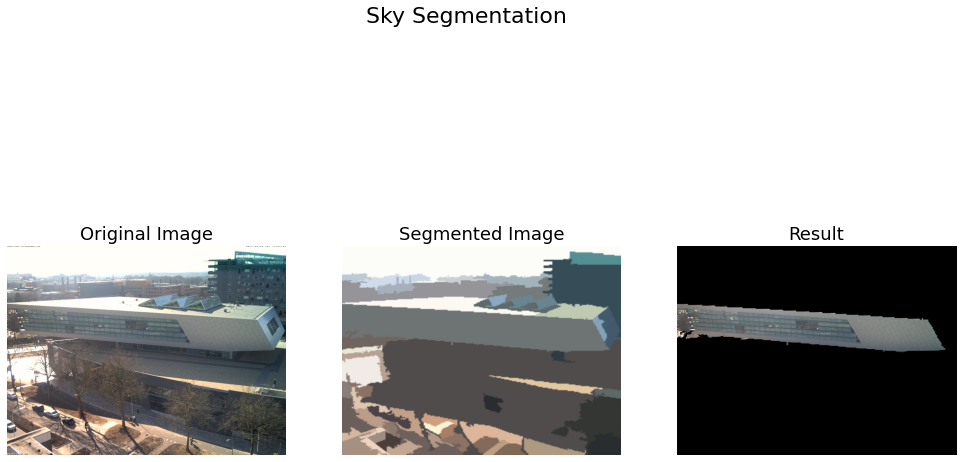

------------------------------------------------------------------------------------------------------------------------
OriginalImages\1093\20140724_145401.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 1093, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.034009695053100586


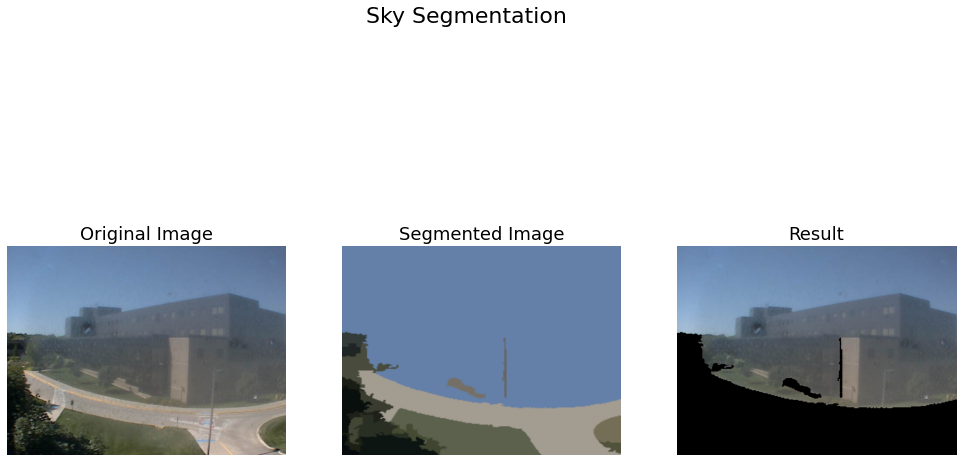

------------------------------------------------------------------------------------------------------------------------
OriginalImages\9291\20140811_141537.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.0675051212310791


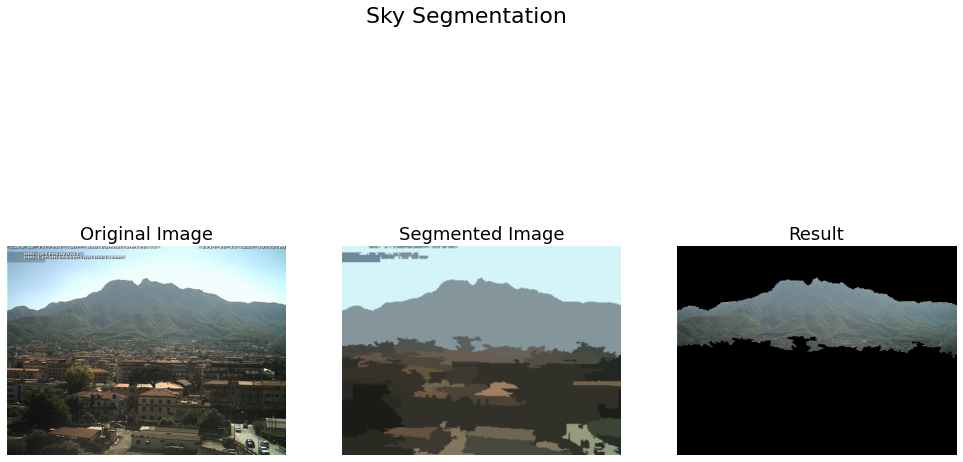

------------------------------------------------------------------------------------------------------------------------


In [17]:
#show number of rows where predicted_value = 1 and ground_truth < 0.2
df_temp = df_output[(df_output['predicted_value'] == 1) & (df_output['ground_truth'] < THRESHOLD)]

#randomly sample 10 image_path values from df_temp and show the images
for path in resample(df_temp['image_path'], n_samples=10):
    img = plt.imread(str(DATASET_FOLDER + "original\\" + path))
    img = cv2.resize(img, (256, 256))
    print(path)
    _ = display_results(DATASET_FOLDER + "original\\" + path, baseline_mean_shift, print_mode = 'display',dataset_mode='original', spatial_radius=2, range_radius=8, min_density=150)

False Negative Cases: Cases where cluster is predicted ground, but is not ground

OriginalImages\10066\20130916_092734.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 10066, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.06524133682250977


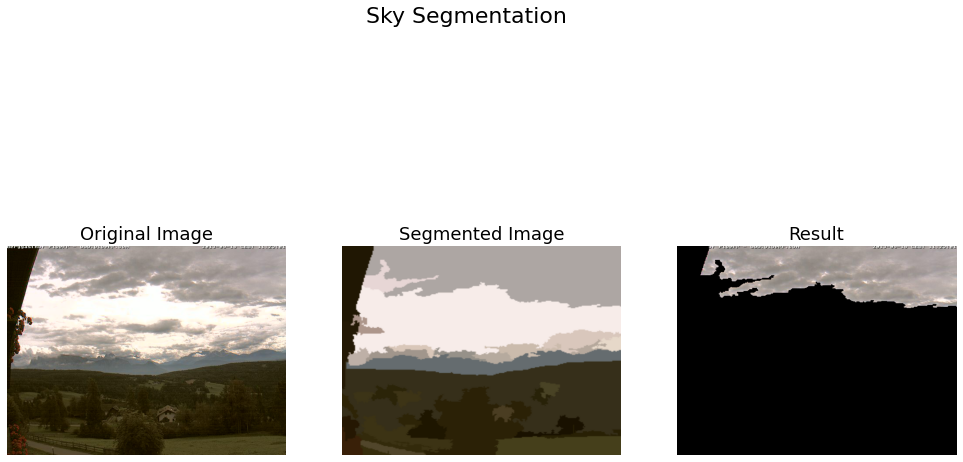

------------------------------------------------------------------------------------------------------------------------
OriginalImages\11160\20131202_162310.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 11160, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.09108972549438477


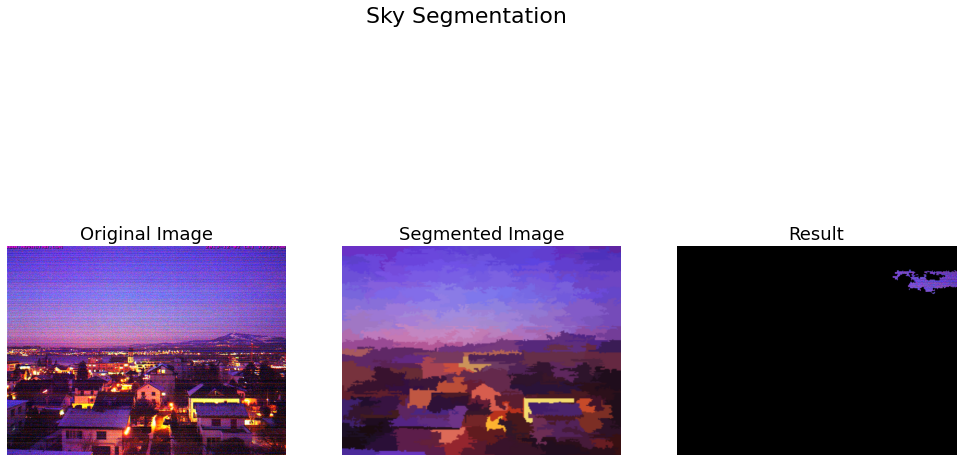

------------------------------------------------------------------------------------------------------------------------
OriginalImages\11160\20130520_102316.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 11160, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.07800698280334473


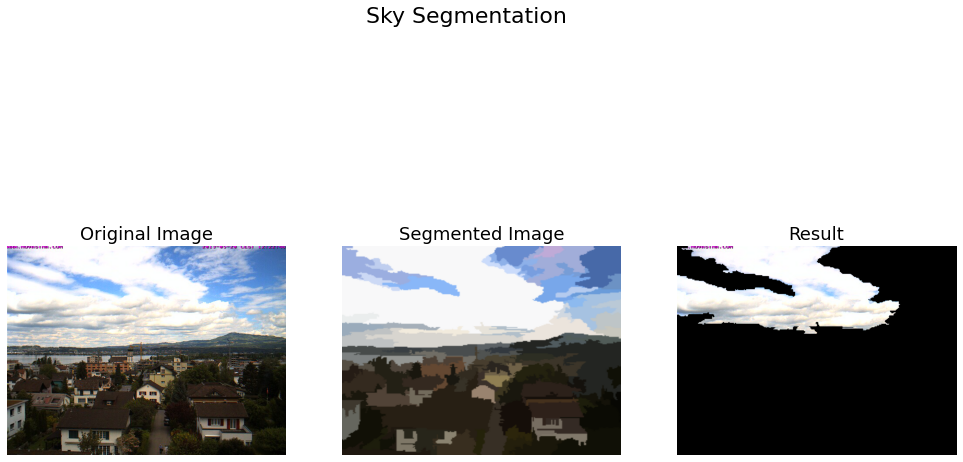

------------------------------------------------------------------------------------------------------------------------
OriginalImages\7211\20120522_041020.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 7211, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.06363058090209961


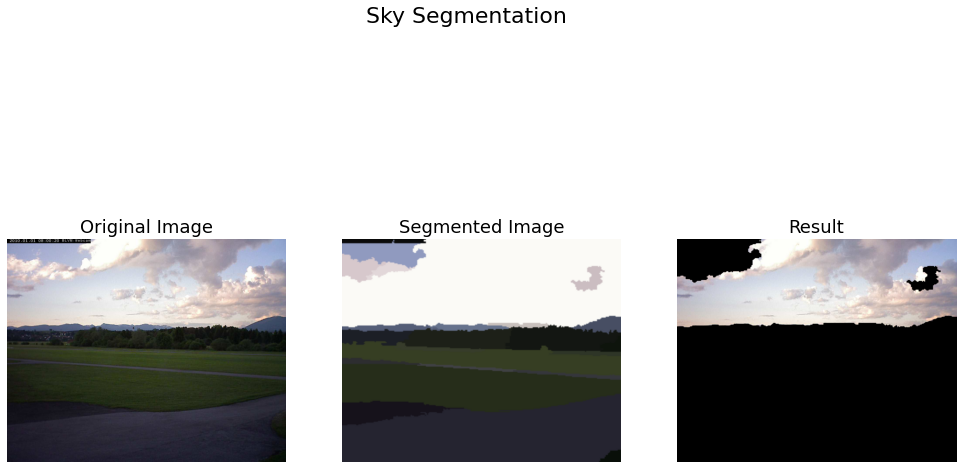

------------------------------------------------------------------------------------------------------------------------
OriginalImages\260\20141015_204451.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 260, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.06839203834533691


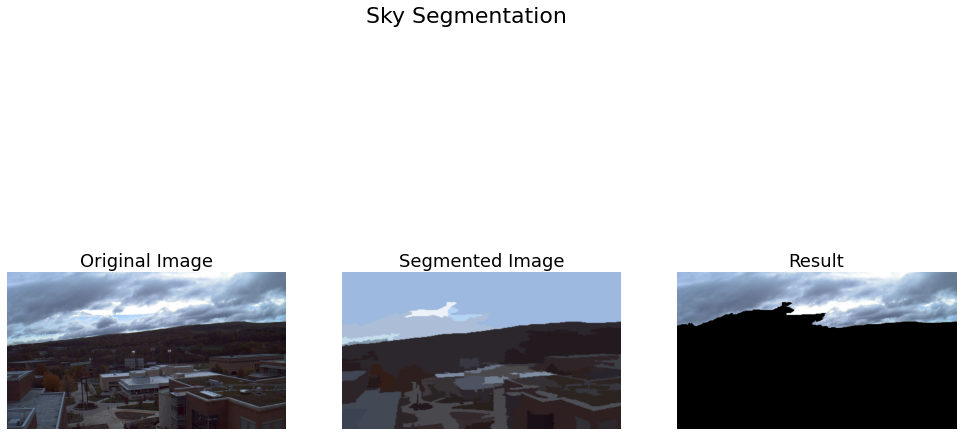

------------------------------------------------------------------------------------------------------------------------
OriginalImages\162\20140910_210839.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 162, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.05699467658996582


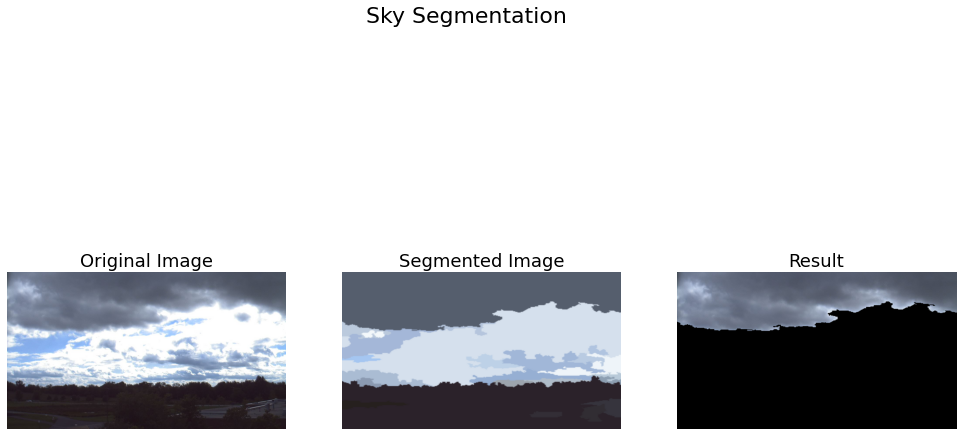

------------------------------------------------------------------------------------------------------------------------
OriginalImages\260\20140905_161457.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 260, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.07502245903015137


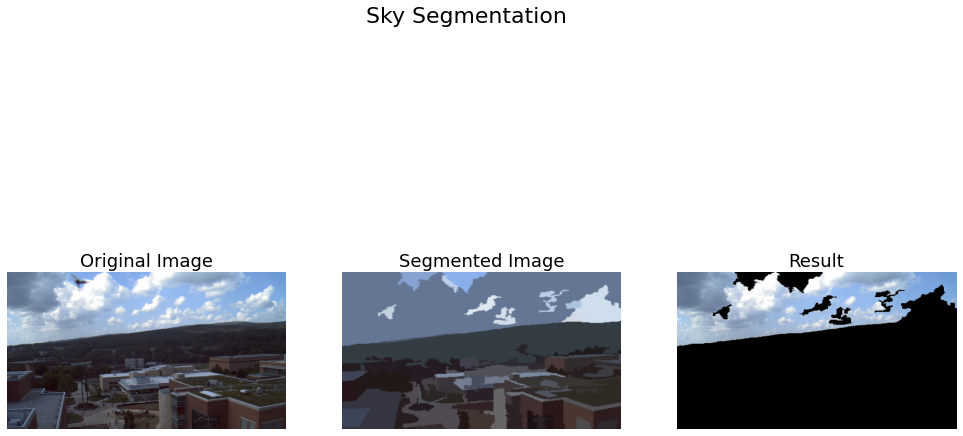

------------------------------------------------------------------------------------------------------------------------
OriginalImages\9291\20140805_141530.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.06503057479858398


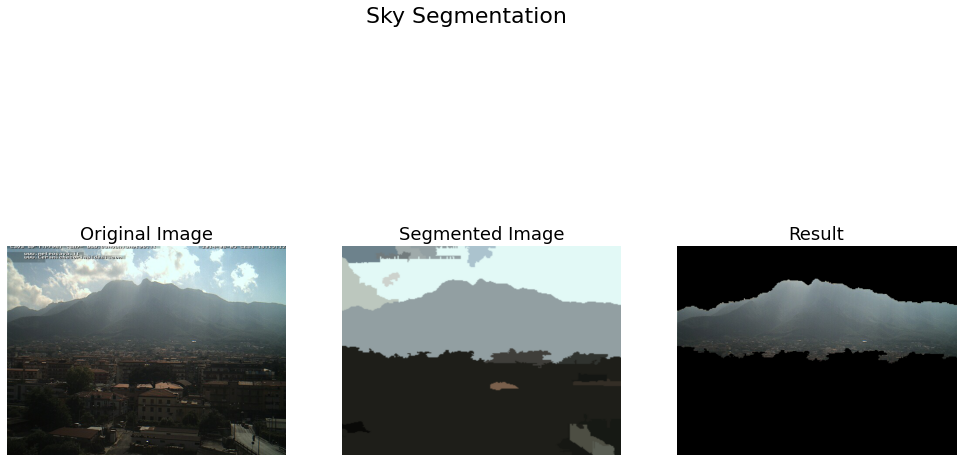

------------------------------------------------------------------------------------------------------------------------
OriginalImages\19106\20130630_223653.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 19106, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.0670015811920166


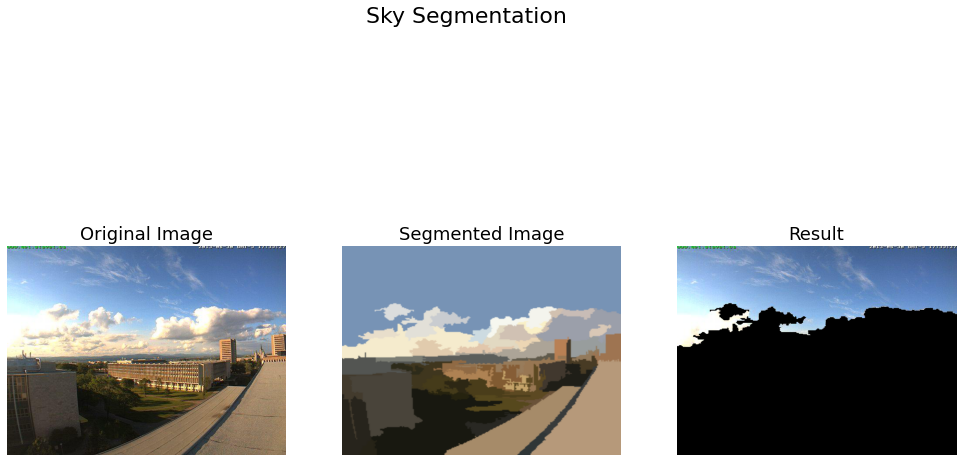

------------------------------------------------------------------------------------------------------------------------
OriginalImages\65\20140717_120312.jpg
------------------------------------------------------------------------------------------------------------------------
Processing: 65, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.09151005744934082


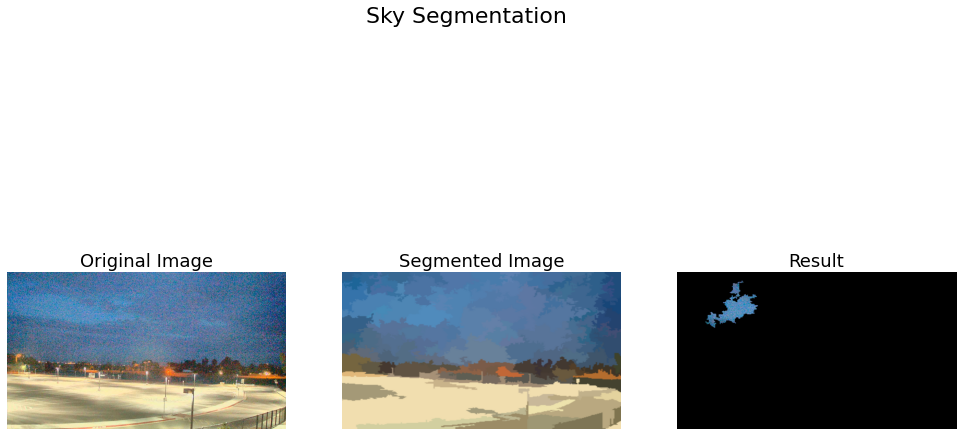

------------------------------------------------------------------------------------------------------------------------


In [18]:
#show number of rows where predicted_value = 0 and ground_truth > 0.2
df_temp = df_output[(df_output['predicted_value'] == 0) & (df_output['ground_truth'] > THRESHOLD)]

#randomly sample 10 image_path values from df_temp and show the images
for path in resample(df_temp['image_path'], n_samples=10):
    img = plt.imread(str(DATASET_FOLDER + "original\\" + path))
    img = cv2.resize(img, (256, 256))
    print(path)
    _ = display_results(DATASET_FOLDER + "original\\" + path, baseline_mean_shift, print_mode = 'display',dataset_mode='original', spatial_radius=2, range_radius=8, min_density=150)

### Undersampling and Resampling

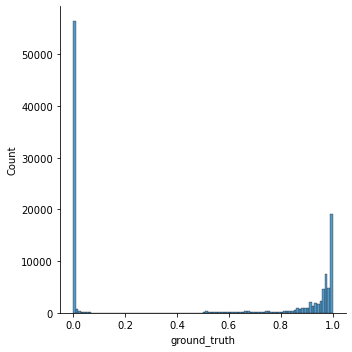

In [8]:
df_resampled = resample_df(df_output,THRESHOLD)
sns.displot(df_resampled['ground_truth'], bins=100)